**Author:** Evgenia Mescheryakova <br>
**Copyright:** 2022 Evgenia Mescheryakova <br>
**License:** MIT

<div class="alert alert-block alert-success">
<a id='TOC_TOP'></a><h3>Annual Mean Temperature and Energy Consumption</h3>
</div>

# NOTEBOOK INTRODUCTION

### Data used


Dataset Title: **Global bioclimatic indicators from 1950 to 2100 derived from climate projections**

Dataset ID: **EO:ECMWF:DAT:SIS_BIODIVERSITY_CMIP5_GLOBAL**

<a href="https://www.wekeo.eu/data?view=dataset&dataset=EO%3AECMWF%3ADAT%3ASIS_BIODIVERSITY_CMIP5_GLOBAL" target="_blank">Details</a>




### Learning outcomes

At the end of this notebook you will know:
* How to process the data in .nc files from WEkEO.
* How to merge it with an external dataset.
* How to visualise results.


### Outline

This notebook explores annual mean of the daily mean temperature at 2 m above the surface (indicator **BIO01**) combined with indicators related to energy consumption worldwide. 
Used datasets: 
* **Global bioclimatic indicators from 1950 to 2100 derived from CMIP5 climate projections** (https://www.wekeo.eu/data?view=dataset&dataset=EO%3AECMWF%3ADAT%3ASIS_BIODIVERSITY_CMIP5_GLOBAL),
* **Our World in Data** Energy dataset: https://github.com/owid/energy-data (owid-energy-data.csv).

To match coordinates to countries, reverse geocoding was used. Country codes were unified (2-letter ISO 3166 alpha-2 codes) to ensure that the datasets can be merged. A few interactive visualisations are made with plotly.

<div class="alert alert-info" role="alert">

## <a id='TOC_TOP'></a>Contents

</div>
   
[1. Energy and Climate Change](#section1)

[2. Python Dependencies](#section2)

[3. Working with Climate Data](#section3)

[3.1. Retrieving the Data](#section3_1)

[3.2. Processing Climate Data](#section3_2)

[3.3. Plotting Climate Data](#section3_3)

[3.4. Transforming Climate Data](#section3_4)

[4. Working with Energy Data](#section4)

[4.1 Processing Energy Data](#section4_1)

[5. Merging Datasets](#section5)

[5.1. Selecting and merging the data](#section5_1)

[5.2. Analysing the combined dataset](#section5_2)

<hr>

<div class="alert alert-info" role="alert">

## <a id='section1'></a>1. Energy and Climate Change
[Back to top](#TOC_TOP)


</div>

There is already a vast body of literature investigating how rising energy consumption impacts climate, in what way it is going to change because of the climate change, and what actions can prevent the worst scenarios. Here are just a few examples of literate reviews and related specific case studies:

* A short overview on how energy market is related to climate change: https://www.morganstanley.com/ideas/energy-economies-climate-change-infographic/

* Future energy demand is likely to increase significantly due to climate change: https://www.nature.com/articles/s41467-019-10399-3

* There is a strong correlation between  energy consumption and climate change variables: https://www.researchgate.net/publication/262192678_Does_energy_consumption_contribute_to_climate_change_Evidence_from_major_regions_of_the_world 

* A Review of Studies Involving the Effects of Climate Change on the Energy Consumption for Building Heating and Cooling: https://www.mdpi.com/1660-4601/18/1/40

* The case of Yangtze River Delta, where annual electricity consumption increases by 9.2% per +1 °C in annual global mean surface temperature and annual peak electricity use increases by 36.1% per +1 °C in annual GMST: https://www.pnas.org/doi/10.1073/pnas.1804667115


<div class="alert alert-info" role="alert">

## <a id='section2'></a>2. Python Dependencies
[Back to top](#TOC_TOP)

</div>

Additional Python modules needed to run this notebook:
* **reverse_geocoder**: https://github.com/thampiman/reverse-geocoder to transform geographical coordinates --> country code
* **pandas** to work with tabular data
* **matplotlib**, **PIL**, and **plotly** for visualisation
* **global_land_mask**: https://github.com/toddkarin/global-land-mask to check if a point lies on the land
* **pycountry**: https://pypi.org/project/pycountry/ to convert country codes


In [13]:
from os.path import exists
from hda import Client
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import PIL
import reverse_geocoder as rg
import pandas as pd
from global_land_mask import globe
import plotly.express as px
import pycountry
import warnings

<div class="alert alert-info" role="alert">

## <a id='section3'></a>3. Working with Climate Data
[Back to top](#TOC_TOP)

</div>

<div class="alert alert-info" role="alert">

### <a id='section3_1'></a>3.1. Retrieving the Data
[Back to top](#TOC_TOP)

</div>

We're starting by downloading the climate dataset from WEkEO. In this case, the file is called BIO01_hadgem2-cc_rcp85_r1i1p1_1950-2100_v1.0.nc and saved in ./dataset-sis-biodiversity-cmip5-global-27fcf7a3-1065-4cab-a5ff-f5d3e2b1bf55 folder.

The query contains more variables, but this notebook only uses the annual mean temperature. It seems interesting to include other variables in the analysis as well, but then this notebook would become huge.

In [3]:
nc_file = './dataset-sis-biodiversity-cmip5-global-27fcf7a3-1065-4cab-a5ff-f5d3e2b1bf55/BIO01_hadgem2-cc_rcp85_r1i1p1_1950-2100_v1.0.nc'

query = {
  "datasetId": "EO:ECMWF:DAT:SIS_BIODIVERSITY_CMIP5_GLOBAL",
  "multiStringSelectValues": [
    {
      "name": "version",
      "value": [
        "1.0"
      ]
    },
    {
      "name": "variable",
      "value": [
        "annual_mean_temperature",
        "mean_diurnal_range",
        "isothermality",
        "annual_precipitation",
        "mean_temperature_of_coldest_quarter",
        "mean_temperature_of_driest_quarter",
        "mean_temperature_of_warmest_quarter",
        "aridity",
        "dry_days",
        "dry_spells",
        "summer_days",
        "maximum_temperature_of_warmest_month",
        "minimum_temperature_of_coldest_month",
        "temperature_annual_range",
        "temperature_seasonality",
        "frost_days",
        "growing_degree_days",
        "growing_season",
        "2m_temperature",
        "precipitation",
        "wind_speed",
        "meridional_wind_speed",
        "zonal_wind_speed"
      ]
    },
    {
      "name": "derived_variable",
      "value": [
        "annual_mean"
      ]
    },
    {
      "name": "model",
      "value": [
        "hadgem2_cc"
      ]
    },
    {
      "name": "experiment",
      "value": [
        "rcp8_5"
      ]
    },
    {
      "name": "temporal_aggregation",
      "value": [
        "annual"
      ]
    },
    {
      "name": "statistic",
      "value": [
        "mean"
      ]
    },
    {
      "name": "ensemble_member",
      "value": [
        "r1i1p1"
      ]
    }
  ],
  "stringChoiceValues": [
    {
      "name": "format",
      "value": "zip"
    }
  ]
}

In [4]:
# if file doesn't exist, download it
if not exists(nc_file):
    print('Downloading data...')
    c = Client(debug=True)
    matches = c.search(query)
    print(matches)
    matches.download()
else:
    print('The .nc file is already here!')
             

The .nc file is already here!


<div class="alert alert-info" role="alert">

### <a id='section3_2'></a>3.2. Processing Climate Data
[Back to top](#TOC_TOP)

</div>

Overview of the dataset:

In [5]:
ds = xr.open_dataset(nc_file, engine='netcdf4')
ds

<xarray.Dataset>
Dimensions:    (latitude: 348, longitude: 720, time: 151)
Coordinates:
  * latitude   (latitude) float64 -89.75 -89.25 -88.75 ... 82.75 83.25 83.75
  * longitude  (longitude) float64 -179.8 -179.2 -178.8 ... 178.8 179.2 179.8
  * time       (time) datetime64[ns] 1950-01-01 1951-01-01 ... 2100-01-01
Data variables:
    BIO01      (time, latitude, longitude) float32 ...
Attributes:
    history:      Thu Jan 28 04:27:57 2021: ncpdq -a time,latitude,longitude ...
    Conventions:  CF-1.7
    Institution:  (C) VITO, Belgium
    References:   See documentation for full references at https://climate.co...
    Contact:      Please contact Copernicus User Support on the Copernicus Cl...
    Version:      v1
    Title:        C3S D427 SIS Biodiversity / Bio-climate indicators / BIO01 ...
    Source:       CMIP5 dataset (rcp85 HadGEM2-CC r1i1p1) bias-adjusted to ER...
    Licence:      ECMWF Copernicus licence 1.0

We will save the BIO01 variable to a DataArray:

In [6]:
bio01 = ds['BIO01']
bio01

<xarray.DataArray 'BIO01' (time: 151, latitude: 348, longitude: 720)>
[37834560 values with dtype=float32]
Coordinates:
  * latitude   (latitude) float64 -89.75 -89.25 -88.75 ... 82.75 83.25 83.75
  * longitude  (longitude) float64 -179.8 -179.2 -178.8 ... 178.8 179.2 179.8
  * time       (time) datetime64[ns] 1950-01-01 1951-01-01 ... 2100-01-01
Attributes:
    time:                  yearly_1950-2100
    source:                HadGEM2-CC_rcp85_r1i1p1_bias-corrected_to_era5_dow...
    space:                 0.5degree_global
    standard_name:         air_temperature
    long_name:             Temperature annual mean
    units:                 K
    history:               2011-09-12T09:21:45Z altered by CMOR: Treated scal...
    model:                 HadGEM2-CC
    experiment:            rcp85
    ensemble_member:       r1i1p1
    period:                1950-2100
    extension:             nc
    model_group:           MOHC
    original_units:        
    source_variable:       tas
    absolute_for_reading:  
    multiyearstat:

Dimensionality and coordinates:

In [7]:
bio01.values.shape

(151, 348, 720)

In [8]:
bio01.coords

Coordinates:
  * latitude   (latitude) float64 -89.75 -89.25 -88.75 ... 82.75 83.25 83.75
  * longitude  (longitude) float64 -179.8 -179.2 -178.8 ... 178.8 179.2 179.8
  * time       (time) datetime64[ns] 1950-01-01 1951-01-01 ... 2100-01-01

In [9]:
bio01.latitude

<xarray.DataArray 'latitude' (latitude: 348)>
array([-89.75, -89.25, -88.75, ...,  82.75,  83.25,  83.75])
Coordinates:
  * latitude  (latitude) float64 -89.75 -89.25 -88.75 ... 82.75 83.25 83.75
Attributes:
    axis:              Y
    long_name:         latitude
    standard_name:     latitude
    units:             degrees_north
    stored_direction:  increasing
    type:              double
    valid_max:         90.0
    valid_min:         -90.0

In [10]:
bio01.dims

('time', 'latitude', 'longitude')

<div class="alert alert-info" role="alert">

### <a id='section3_3'></a>3.3. Plotting Climate Data
[Back to top](#TOC_TOP)

</div>

Let's plot one year (2021) mean annual temperature on a map:

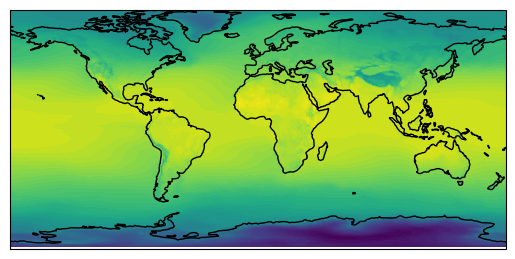

In [11]:
bio01_year = bio01.loc["2021-01-01":"2021-01-02", :]
bio01_year.values.shape

ax = plt.axes(projection=ccrs.PlateCarree())

plt.contourf(bio01_year.longitude, 
             bio01_year.latitude, 
             bio01_year.values[0,:,:], 60,
             transform=ccrs.PlateCarree())

ax.coastlines()

plt.show()

To visualise the changes year by year (1950-2100), we can generate a .jpg file for each year and then combine them into a gif file. In this case, temporary .jpg images are stored in **./output/**, and the result file is called **bio01.gif**.

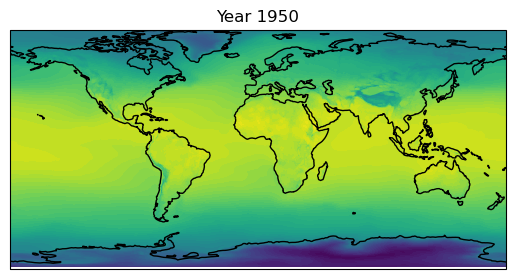

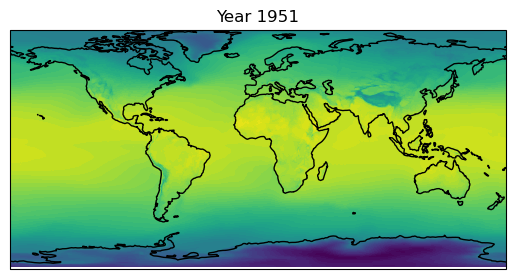

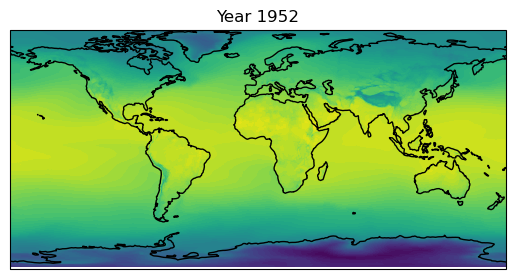

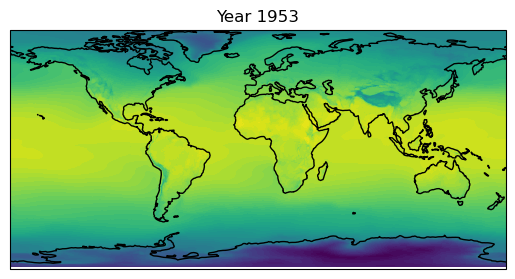

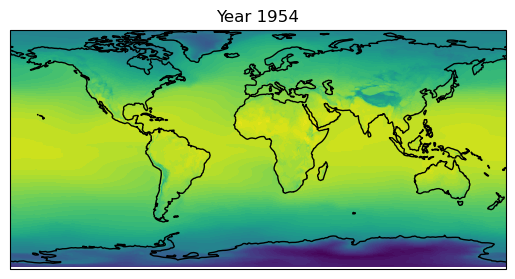

...

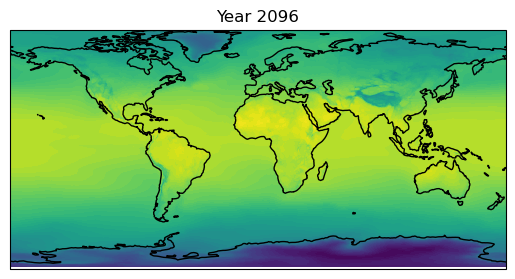

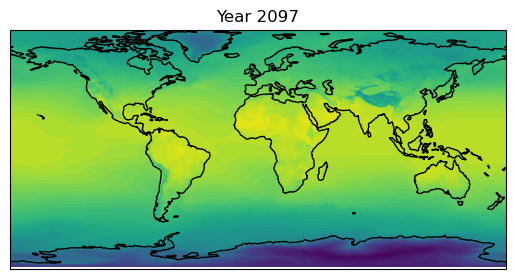

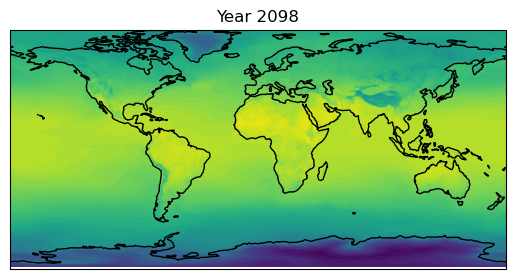

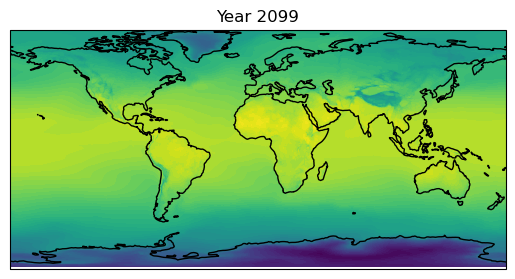

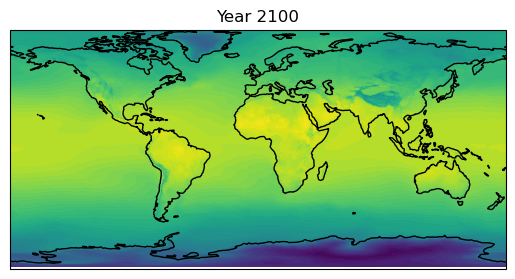

In [16]:
years = np.arange(1950, 2101)
image_frames = []

lon, lat = bio01.longitude, bio01.latitude

for y in years:
    ax = plt.axes(projection=ccrs.PlateCarree())
    ax.coastlines()
    ax.set_title('Year '+ str(y))
    plt.contourf(lon, lat,
                 bio01.loc[f"{y}-01-01": f"{y}-01-02", :].values[0,:,:], 60, 
                 transform=ccrs.PlateCarree())
    
    plt.savefig(f'./output/{y}.jpg')
    plt.pause(1)
    new_frame = PIL.Image.open(f'./output/{y}.jpg') 
    image_frames.append(new_frame)

# plt.show()
image_frames[0].save('bio01.gif',
                     format='GIF',
                     append_images = image_frames[1: ],
                     save_all = True, 
                     duration = 100,
                     loop = 0)


<div class="alert alert-info" role="alert">

### <a id='section3_4'></a>3.4. Transforming Climate Data
[Back to top](#TOC_TOP)

</div>

Three more steps to prepare climate data for the dataset merging:
1. Transform the data to pandas DataFrame.
2. Filter out the points that are on water, leaving only the land.
3. Apply reverse-geocoding to match coordinates to countries.

Transforming DataArray to pandas DataFrame:

In [17]:
df = bio01.to_dataframe().reset_index()
df

,time,latitude,longitude,BIO01
0,1950-01-01,-89.75,-179.75,NaN
1,1950-01-01,-89.75,-179.25,NaN
2,1950-01-01,-89.75,-178.75,NaN
3,1950-01-01,-89.75,-178.25,NaN
4,1950-01-01,-89.75,-177.75,NaN
...,...,...,...,...
37834555,2100-01-01,83.75,177.75,275.465332
37834556,2100-01-01,83.75,178.25,275.467957
37834557,2100-01-01,83.75,178.75,275.458191
37834558,2100-01-01,83.75,179.25,275.455139


In this case we're only interested in the points that are on the land. To remove the rest, we'll use the module **global_land_mask**. For example:

In [18]:
globe.is_land(lat=13.25, lon=-39.25)

False

In [19]:
df['is_land'] = globe.is_land(df.latitude, df.longitude)
df_land = df[df.is_land]

With reverse geocoding one can find which country a set of coordinates points to. For example:

In [20]:
coordinates = (51.5214588, -0.1729636)
rg.search(coordinates)

Loading formatted geocoded file...


[{'lat': '51.51116',
  'lon': '-0.18426',
  'name': 'Bayswater',
  'admin1': 'England',
  'admin2': 'Greater London',
  'cc': 'GB'}]

Applying reverse-geocoder to the whole dataframe:

In [21]:
reverse_geocoded = rg.search(list(zip(df_land.latitude, df_land.longitude)))
reverse_geocoded[:3]

[{'lat': '-43.95353',
  'lon': '-176.55973',
  'name': 'Waitangi',
  'admin1': 'Chatham Islands',
  'admin2': '',
  'cc': 'NZ'},
 {'lat': '-43.95353',
  'lon': '-176.55973',
  'name': 'Waitangi',
  'admin1': 'Chatham Islands',
  'admin2': '',
  'cc': 'NZ'},
 {'lat': '-43.95353',
  'lon': '-176.55973',
  'name': 'Waitangi',
  'admin1': 'Chatham Islands',
  'admin2': '',
  'cc': 'NZ'}]

Extracting country codes from the dictionary:

In [22]:
df_land['country_code'] = [place['cc'] for place in reverse_geocoded]
df_land

/var/folders/p2/tgvyp6f51vjb5bfrp45srwk00000gp/T/ipykernel_26261/1555877408.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_land['country_code'] = [place['cc'] for place in reverse_geocoded]


,time,latitude,longitude,BIO01,is_land,country_code
0,1950-01-01,-89.75,-179.75,NaN,True,NZ
1,1950-01-01,-89.75,-179.25,NaN,True,NZ
2,1950-01-01,-89.75,-178.75,NaN,True,NZ
3,1950-01-01,-89.75,-178.25,NaN,True,NZ
4,1950-01-01,-89.75,-177.75,NaN,True,NZ
...,...,...,...,...,...,...
37833423,2100-01-01,83.25,-28.25,267.931671,True,IS
37833424,2100-01-01,83.25,-27.75,268.395142,True,IS
37833425,2100-01-01,83.25,-27.25,268.876404,True,IS
37833426,2100-01-01,83.25,-26.75,269.437836,True,IS


Removing all lines with missing BIO01 values:

In [23]:
df_land = df_land.dropna(subset='BIO01')
df_land

,time,latitude,longitude,BIO01,is_land,country_code
2160,1950-01-01,-88.25,-179.75,228.488708,True,NZ
2161,1950-01-01,-88.25,-179.25,228.537003,True,NZ
2162,1950-01-01,-88.25,-178.75,228.564819,True,NZ
2163,1950-01-01,-88.25,-178.25,228.591858,True,NZ
2164,1950-01-01,-88.25,-177.75,228.623978,True,NZ
...,...,...,...,...,...,...
37833423,2100-01-01,83.25,-28.25,267.931671,True,IS
37833424,2100-01-01,83.25,-27.75,268.395142,True,IS
37833425,2100-01-01,83.25,-27.25,268.876404,True,IS
37833426,2100-01-01,83.25,-26.75,269.437836,True,IS


Plotting a sample of 100 points as a sanity check:

In [68]:
fig = px.scatter_geo(df_land.sample(n = 100),
                     lat='latitude', lon='longitude', 
                     text='country_code',
                     color="is_land",
                     title='100-point sample with country codes'
                    )
fig.show()

<div class="alert alert-info" role="alert">

## <a id='section4'></a>4. Working with Energy Data
[Back to top](#TOC_TOP)

</div>

For the energy-related data, the dataset by **Our World in Data** was chosen. The CSV can be downloaded from the github repo: https://github.com/owid/energy-data (see owid-energy-data.csv).

A short column description is provided in the codebook: https://github.com/owid/energy-data/blob/master/owid-energy-codebook.csv

We'll use the following metrics:
* electricity_demand: electricity demand, measured in terawatt-hours  
* energy_per_capita: primary energy consumption per capita, measured in kilowatt-hours (more on what's primary energy: https://ourworldindata.org/energy-substitution-method)
* energy_per_gdp: energy consumption per unit of GDP. This is measured in kilowatt-hours per 2011 international-$
* greenhouse_gas_emissions: greenhouse-gas emissions produced in the generation of electricity, measured in million tonnes of CO2 equivalent


<div class="alert alert-info" role="alert">

### <a id='section4_1'></a>4.1 Processing Energy Data
[Back to top](#TOC_TOP)

</div>

Reading the file into pandas DataFrame:

In [25]:
df_energy = pd.read_csv('owid-energy-data.csv')
df_energy

,country,year,iso_code,population,gdp,biofuel_cons_change_pct,biofuel_cons_change_twh,biofuel_cons_per_capita,biofuel_consumption,biofuel_elec_per_capita,...,solar_share_elec,solar_share_energy,wind_cons_change_pct,wind_cons_change_twh,wind_consumption,wind_elec_per_capita,wind_electricity,wind_energy_per_capita,wind_share_elec,wind_share_energy
0,Afghanistan,1900,AFG,4832414.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Afghanistan,1901,AFG,4879685.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Afghanistan,1902,AFG,4935122.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Afghanistan,1903,AFG,4998861.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Afghanistan,1904,AFG,5063419.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22338,Zimbabwe,2017,ZWE,14236599.0,2.194784e+10,NaN,NaN,NaN,NaN,22.477,...,0.137,NaN,NaN,NaN,NaN,0.0,0.0,NaN,0.0,NaN
22339,Zimbabwe,2018,ZWE,14438812.0,2.271535e+10,NaN,NaN,NaN,NaN,27.011,...,0.110,NaN,NaN,NaN,NaN,0.0,0.0,NaN,0.0,NaN
22340,Zimbabwe,2019,ZWE,14645473.0,NaN,NaN,NaN,NaN,NaN,25.947,...,0.088,NaN,NaN,NaN,NaN,0.0,0.0,NaN,0.0,NaN
22341,Zimbabwe,2020,ZWE,14862927.0,NaN,NaN,NaN,NaN,NaN,24.221,...,0.090,NaN,NaN,NaN,NaN,0.0,0.0,NaN,0.0,NaN


Selecting the columns that we're interested in:

In [26]:
df_energy_subset = df_energy[df_energy.iso_code.notnull()][['country', 'iso_code', 'year', 'electricity_demand', 
                       'energy_per_capita', 'energy_per_gdp', 'greenhouse_gas_emissions']]
df_energy_subset

,country,iso_code,year,electricity_demand,energy_per_capita,energy_per_gdp,greenhouse_gas_emissions
0,Afghanistan,AFG,1900,NaN,NaN,NaN,NaN
1,Afghanistan,AFG,1901,NaN,NaN,NaN,NaN
2,Afghanistan,AFG,1902,NaN,NaN,NaN,NaN
3,Afghanistan,AFG,1903,NaN,NaN,NaN,NaN
4,Afghanistan,AFG,1904,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...
22338,Zimbabwe,ZWE,2017,9.53,3226.617,2.093,2.66
22339,Zimbabwe,ZWE,2018,10.15,3289.887,2.091,3.27
22340,Zimbabwe,ZWE,2019,12.42,3374.877,NaN,3.26
22341,Zimbabwe,ZWE,2020,12.22,NaN,NaN,3.10


To convert 3-char country codes to 2-char ones, we'll use module **pycountry**, for example:

In [27]:
pycountry.countries.get(alpha_3='BGR')

Country(alpha_2='BG', alpha_3='BGR', flag='🇧🇬', name='Bulgaria', numeric='100', official_name='Republic of Bulgaria')

In [28]:
def get_country_code(x):
    ''' convert country code; if nothing is found, return None '''
    country = pycountry.countries.get(alpha_3=x['iso_code'])
    try:
        return country.alpha_2
    except AttributeError as err:
        return None

In [29]:
df_energy_subset['country_code_2'] = df_energy_subset.apply(get_country_code, axis=1)
df_energy_subset

,country,iso_code,year,electricity_demand,energy_per_capita,energy_per_gdp,greenhouse_gas_emissions,country_code_2
0,Afghanistan,AFG,1900,NaN,NaN,NaN,NaN,AF
1,Afghanistan,AFG,1901,NaN,NaN,NaN,NaN,AF
2,Afghanistan,AFG,1902,NaN,NaN,NaN,NaN,AF
3,Afghanistan,AFG,1903,NaN,NaN,NaN,NaN,AF
4,Afghanistan,AFG,1904,NaN,NaN,NaN,NaN,AF
...,...,...,...,...,...,...,...,...
22338,Zimbabwe,ZWE,2017,9.53,3226.617,2.093,2.66,ZW
22339,Zimbabwe,ZWE,2018,10.15,3289.887,2.091,3.27,ZW
22340,Zimbabwe,ZWE,2019,12.42,3374.877,NaN,3.26,ZW
22341,Zimbabwe,ZWE,2020,12.22,NaN,NaN,3.10,ZW


We'll ignore the rows which country code wasn't found:

In [30]:
df_energy_subset = df_energy_subset[df_energy_subset.country_code_2.notnull()]
df_energy_subset

,country,iso_code,year,electricity_demand,energy_per_capita,energy_per_gdp,greenhouse_gas_emissions,country_code_2
0,Afghanistan,AFG,1900,NaN,NaN,NaN,NaN,AF
1,Afghanistan,AFG,1901,NaN,NaN,NaN,NaN,AF
2,Afghanistan,AFG,1902,NaN,NaN,NaN,NaN,AF
3,Afghanistan,AFG,1903,NaN,NaN,NaN,NaN,AF
4,Afghanistan,AFG,1904,NaN,NaN,NaN,NaN,AF
...,...,...,...,...,...,...,...,...
22338,Zimbabwe,ZWE,2017,9.53,3226.617,2.093,2.66,ZW
22339,Zimbabwe,ZWE,2018,10.15,3289.887,2.091,3.27,ZW
22340,Zimbabwe,ZWE,2019,12.42,3374.877,NaN,3.26,ZW
22341,Zimbabwe,ZWE,2020,12.22,NaN,NaN,3.10,ZW


And take only 1980-2019 data.

In [31]:
df_energy_selected = df_energy_subset[(df_energy_subset.year >= 1980) & (df_energy_subset.year < 2020)]
df_energy_selected

,country,iso_code,year,electricity_demand,energy_per_capita,energy_per_gdp,greenhouse_gas_emissions,country_code_2
80,Afghanistan,AFG,1980,NaN,583.294,0.508,NaN,AF
81,Afghanistan,AFG,1981,NaN,666.378,0.561,NaN,AF
82,Afghanistan,AFG,1982,NaN,725.660,0.585,NaN,AF
83,Afghanistan,AFG,1983,NaN,912.140,0.683,NaN,AF
84,Afghanistan,AFG,1984,NaN,941.393,0.673,NaN,AF
...,...,...,...,...,...,...,...,...
22336,Zimbabwe,ZWE,2015,9.29,3956.026,2.599,3.51,ZW
22337,Zimbabwe,ZWE,2016,8.67,3326.073,2.226,3.02,ZW
22338,Zimbabwe,ZWE,2017,9.53,3226.617,2.093,2.66,ZW
22339,Zimbabwe,ZWE,2018,10.15,3289.887,2.091,3.27,ZW


How many countries are now available?

In [32]:
selected_countries = set(df_energy_selected.country_code_2)
len(selected_countries)

218

And how many of them are included in the climate dataset?

In [33]:
len(selected_countries & set(df_land.country_code))

190

<div class="alert alert-info" role="alert">

## <a id='section5'></a>5. Merging Datasets
[Back to top](#TOC_TOP)

</div>

<div class="alert alert-info" role="alert">

### <a id='section5_1'></a>5.1 Selecting and merging the data
[Back to top](#TOC_TOP)

</div>

The two datasets will be merged in this section.

In [69]:
df_land

,time,latitude,longitude,BIO01,is_land,country_code
2160,1950-01-01,-88.25,-179.75,228.488708,True,NZ
2161,1950-01-01,-88.25,-179.25,228.537003,True,NZ
2162,1950-01-01,-88.25,-178.75,228.564819,True,NZ
2163,1950-01-01,-88.25,-178.25,228.591858,True,NZ
2164,1950-01-01,-88.25,-177.75,228.623978,True,NZ
...,...,...,...,...,...,...
37833423,2100-01-01,83.25,-28.25,267.931671,True,IS
37833424,2100-01-01,83.25,-27.75,268.395142,True,IS
37833425,2100-01-01,83.25,-27.25,268.876404,True,IS
37833426,2100-01-01,83.25,-26.75,269.437836,True,IS


Restricting the climate dataset to years 1980-2019 and previously selected list of countries:

In [70]:
t1, t2 = 1980, 2020

def filter_time_country(row):
    if t1 <= row.time.year < t2 and row.country_code in selected_countries:
        return True
    else:
        return False


In [71]:
df_filtered = df_land[df_land.apply(filter_time_country, axis=1)]

Save the year as a separate column:

In [72]:
df_filtered['year'] = df_filtered.time.dt.year
df_filtered

/var/folders/p2/tgvyp6f51vjb5bfrp45srwk00000gp/T/ipykernel_26261/2071424724.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,time,latitude,longitude,BIO01,is_land,country_code,year
7518960,1980-01-01,-88.25,-179.75,227.628860,True,NZ,1980
7518961,1980-01-01,-88.25,-179.25,227.668427,True,NZ,1980
7518962,1980-01-01,-88.25,-178.75,227.706207,True,NZ,1980
7518963,1980-01-01,-88.25,-178.25,227.743210,True,NZ,1980
7518964,1980-01-01,-88.25,-177.75,227.770264,True,NZ,1980
...,...,...,...,...,...,...,...
17538063,2019-01-01,83.25,-28.25,255.579620,True,IS,2019
17538064,2019-01-01,83.25,-27.75,256.079468,True,IS,2019
17538065,2019-01-01,83.25,-27.25,256.595459,True,IS,2019
17538066,2019-01-01,83.25,-26.75,256.992737,True,IS,2019


Computing the mean temperature for each country, each year:

In [73]:
country_year_mean = df_filtered.groupby(['country_code', 'year'], as_index=False).BIO01.mean()
country_year_mean

,country_code,year,BIO01
0,AE,1980,301.575867
1,AE,1981,301.203247
2,AE,1982,300.646210
3,AE,1983,300.553253
4,AE,1984,300.607635
...,...,...,...
7595,ZW,2015,295.092865
7596,ZW,2016,296.949646
7597,ZW,2017,297.194366
7598,ZW,2018,294.956421


Next, we'll merge a subset of the energy dataset with the transformed climate data.

In [74]:
df_match = df_energy_selected[['country_code_2', 'country', 'year', 
                               'energy_per_capita', 
                               'energy_per_gdp', 
                               'electricity_demand',
                              'greenhouse_gas_emissions']]
df_match

,country_code_2,country,year,energy_per_capita,energy_per_gdp,electricity_demand,greenhouse_gas_emissions
80,AF,Afghanistan,1980,583.294,0.508,NaN,NaN
81,AF,Afghanistan,1981,666.378,0.561,NaN,NaN
82,AF,Afghanistan,1982,725.660,0.585,NaN,NaN
83,AF,Afghanistan,1983,912.140,0.683,NaN,NaN
84,AF,Afghanistan,1984,941.393,0.673,NaN,NaN
...,...,...,...,...,...,...,...
22336,ZW,Zimbabwe,2015,3956.026,2.599,9.29,3.51
22337,ZW,Zimbabwe,2016,3326.073,2.226,8.67,3.02
22338,ZW,Zimbabwe,2017,3226.617,2.093,9.53,2.66
22339,ZW,Zimbabwe,2018,3289.887,2.091,10.15,3.27


In [75]:
df_result = pd.merge(left=country_year_mean, right=df_match, 
         left_on=['country_code', 'year'], 
         right_on=['country_code_2', 'year'])
df_result.drop(['country_code_2'], axis=1, inplace=True)
df_result

,country_code,year,BIO01,country,energy_per_capita,energy_per_gdp,electricity_demand,greenhouse_gas_emissions
0,AE,1980,301.575867,United Arab Emirates,106086.977,2.448,NaN,NaN
1,AE,1981,301.203247,United Arab Emirates,114835.070,2.773,NaN,NaN
2,AE,1982,300.646210,United Arab Emirates,116727.438,3.263,NaN,NaN
3,AE,1983,300.553253,United Arab Emirates,106243.258,3.297,NaN,NaN
4,AE,1984,300.607635,United Arab Emirates,125618.664,3.938,NaN,NaN
...,...,...,...,...,...,...,...,...
7312,ZW,2015,295.092865,Zimbabwe,3956.026,2.599,9.29,3.51
7313,ZW,2016,296.949646,Zimbabwe,3326.073,2.226,8.67,3.02
7314,ZW,2017,297.194366,Zimbabwe,3226.617,2.093,9.53,2.66
7315,ZW,2018,294.956421,Zimbabwe,3289.887,2.091,10.15,3.27


<div class="alert alert-info" role="alert">

### <a id='section5_2'></a>5.2. Analysing the combined dataset
[Back to top](#TOC_TOP)

</div>

Sorting results by country and year:

In [76]:
df_result_sorted = df_result.sort_values(['country_code', 'year'])
df_result_sorted

,country_code,year,BIO01,country,energy_per_capita,energy_per_gdp,electricity_demand,greenhouse_gas_emissions
0,AE,1980,301.575867,United Arab Emirates,106086.977,2.448,NaN,NaN
1,AE,1981,301.203247,United Arab Emirates,114835.070,2.773,NaN,NaN
2,AE,1982,300.646210,United Arab Emirates,116727.438,3.263,NaN,NaN
3,AE,1983,300.553253,United Arab Emirates,106243.258,3.297,NaN,NaN
4,AE,1984,300.607635,United Arab Emirates,125618.664,3.938,NaN,NaN
...,...,...,...,...,...,...,...,...
7312,ZW,2015,295.092865,Zimbabwe,3956.026,2.599,9.29,3.51
7313,ZW,2016,296.949646,Zimbabwe,3326.073,2.226,8.67,3.02
7314,ZW,2017,297.194366,Zimbabwe,3226.617,2.093,9.53,2.66
7315,ZW,2018,294.956421,Zimbabwe,3289.887,2.091,10.15,3.27


To analyse the changes in annual mean temperature, compute the consecutive differences in BIO01:

In [77]:
df_result_sorted['BIO01_diff'] = df_result_sorted['BIO01'] - df_result_sorted.groupby(['country_code'])['BIO01'].shift()
df_result_sorted

,country_code,year,BIO01,country,energy_per_capita,energy_per_gdp,electricity_demand,greenhouse_gas_emissions,BIO01_diff
0,AE,1980,301.575867,United Arab Emirates,106086.977,2.448,NaN,NaN,NaN
1,AE,1981,301.203247,United Arab Emirates,114835.070,2.773,NaN,NaN,-0.372620
2,AE,1982,300.646210,United Arab Emirates,116727.438,3.263,NaN,NaN,-0.557037
3,AE,1983,300.553253,United Arab Emirates,106243.258,3.297,NaN,NaN,-0.092957
4,AE,1984,300.607635,United Arab Emirates,125618.664,3.938,NaN,NaN,0.054382
...,...,...,...,...,...,...,...,...,...
7312,ZW,2015,295.092865,Zimbabwe,3956.026,2.599,9.29,3.51,-0.020599
7313,ZW,2016,296.949646,Zimbabwe,3326.073,2.226,8.67,3.02,1.856781
7314,ZW,2017,297.194366,Zimbabwe,3226.617,2.093,9.53,2.66,0.244720
7315,ZW,2018,294.956421,Zimbabwe,3289.887,2.091,10.15,3.27,-2.237946


And the mean difference for each country:

In [78]:
mean_diff = df_result_sorted.groupby(['country_code', 'country'], as_index=False)['BIO01_diff'].mean()
mean_diff

,country_code,country,BIO01_diff
0,AE,United Arab Emirates,0.022794
1,AF,Afghanistan,0.009107
2,AL,Albania,0.033343
3,AM,Armenia,0.094220
4,AO,Angola,0.020646
...,...,...,...
185,WS,Samoa,0.019557
186,YE,Yemen,0.029788
187,ZA,South Africa,0.038550
188,ZM,Zambia,0.013161


Do the same for the electricity demand to check how quickly the demand grows:

In [79]:
df_result_sorted['electricity_demand_diff'] = df_result_sorted['electricity_demand'] - df_result_sorted.groupby(['country_code'])['electricity_demand'].shift()
mean_diff_energy = df_result_sorted.groupby('country_code', as_index=False)['electricity_demand_diff'].mean()
mean_diff_energy

,country_code,electricity_demand_diff
0,AE,4.834737
1,AF,0.284211
2,AL,0.141379
3,AM,0.057368
4,AO,0.640000
...,...,...
185,WS,0.001579
186,YE,0.012105
187,ZA,1.524211
188,ZM,0.463158


Merging the tables with mean differences into one:

In [80]:
mean_diff_merged = pd.merge(left=mean_diff, right=mean_diff_energy).dropna(how='any')
mean_diff_merged

,country_code,country,BIO01_diff,electricity_demand_diff
0,AE,United Arab Emirates,0.022794,4.834737
1,AF,Afghanistan,0.009107,0.284211
2,AL,Albania,0.033343,0.141379
3,AM,Armenia,0.094220,0.057368
4,AO,Angola,0.020646,0.640000
...,...,...,...,...
185,WS,Samoa,0.019557,0.001579
186,YE,Yemen,0.029788,0.012105
187,ZA,South Africa,0.038550,1.524211
188,ZM,Zambia,0.013161,0.463158


Plotting results (please note that plotly provides a useful toolbox in upper right corner of the plot):

In [81]:
fig = px.scatter(mean_diff_merged,
                 x='BIO01_diff', y='electricity_demand_diff',
                 text = 'country_code',
                 hover_name="country",
                 title='Mean annual changes in electricity demand and annual mean temperature'
                )
fig.show()

More on how urbanisation is affecting energy consumption in China: https://www.sciencedirect.com/science/article/abs/pii/S2212095517301013

More details on South Sudan: https://ourworldindata.org/energy/country/south-sudan


Same plot without the outliers (China, India):

In [82]:
fig = px.scatter(mean_diff_merged[~mean_diff_merged.country.isin(['China', 'India'])],
                 x='BIO01_diff', y='electricity_demand_diff',
                 text='country_code',
                 hover_name="country",
                 title='Mean annual changes in electricity demand and annual mean temperature'
                    )
fig.show()

Annual mean temperature and electricity demand, all countries, year by year (note that plotly allows to zoom in the areas with many points):

In [83]:
fig = px.scatter(df_result_sorted,
                 x='year', y='electricity_demand',
                 color="BIO01",
                 hover_name="country_code", 
                 hover_data=['country', 'year'],
                 title='Electricity demand by year and annual mean temperature'
                )
fig.show()

To see more details, let's plot average energy consumption per person for one country, e.g. South Korea:

In [84]:
country = 'South Korea'
fig = px.scatter(df_result_sorted[df_result_sorted.country == country],
                 x='year', y='energy_per_capita',
                 color="BIO01",
                 hover_name="country_code", 
                 hover_data=['country', 'year'],
                 title='Energy use per person, by year, and annual mean temperature'
                )
fig.show()

There is a significant fall in 1998 (which can't be attributed to the change of temperature) - it might correspond to the [financial crisis](https://en.wikipedia.org/wiki/1997_Asian_financial_crisis).

<br/>
This notebook shows how the data from WEkEO platform can be combined with an external dataset. The original datasets contain a lot more data than what is displayed here. Other .nc files can be processed the same way and provide more information for analysis.

*I would like to express my gratitude to Ilia Uchitel for his ideas, understanding and support.*

⛰️ *Madeira, September 2022*

<hr>